# Evaluation Project 10 - Insurance Claims Fraud Detection

## Importing necessary libraries

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split as TTS
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn import datasets, metrics, model_selection
import joblib

import warnings
warnings.filterwarnings('ignore')

## Loading the dataset

In [2]:
df = pd.read_csv("Automobile_insurance_fraud.csv")
pd.set_option("display.max_columns",None)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


## Dataset Description

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

## EDA

In [3]:
df.shape

(1000, 40)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

- `it appears all columns have zero null values`
- `_c39 has all null values and can therefore be dropped`
- `the columns have both numerical and categorical data`

In [5]:
df.drop("_c39",axis=1,inplace=True)

In [6]:
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


`Both - policy_number and incident_location have 1000 unique values (each record is unique), therefore, they may be dropped from the dataset for the purpose of prediction`

## Data Preprocessing

In [7]:
df.drop("policy_number",axis=1,inplace=True)
df.drop("incident_location",axis=1,inplace=True)

In [8]:
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64


OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


1000    351
500     342
2000    3

- `umbrella_limit has around 80% values that are 0, so we may drop the column`
- `insured_zip are the zip codes of policy holders and 995 unique values - may be dropped`

In [9]:
df.drop("umbrella_limit",axis=1,inplace=True)
df.drop('insured_zip',axis=1,inplace=True)

In [10]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

`Date columns have been converted into the appropriate data type, and need to be split into day, month and year for the purpose of prediction`

In [11]:
df['policy_bind_day'] = df['policy_bind_date'].dt.day
df['policy_bind_month'] = df['policy_bind_date'].dt.month
df['policy_bind_year'] = df['policy_bind_date'].dt.year

In [12]:
df['incident_day'] = df['incident_date'].dt.day
df['incident_month'] = df['incident_date'].dt.month
df['incident_year'] = df['incident_date'].dt.year

In [13]:
df.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

`On review of the dataset at the time of loading and from the summary of unique values printed, some columns have "?" as a record, which is basically an unknown record, i.e. null value, and needs to be updated`

In [14]:
df[df.columns[(df=="?").any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

`Since all the columns that contain "?" contain categorical data, we can replace them with appropriate values of the column`

In [15]:
print("collision_type:",df['collision_type'].mode())
print("property_damage:",df['property_damage'].mode())
print("police_report_available:",df['police_report_available'].mode())

collision_type: 0    Rear Collision
dtype: object
property_damage: 0    ?
dtype: object
police_report_available: 0     ?
1    NO
dtype: object


In [16]:
print(df["property_damage"].value_counts())

?      360
NO     338
YES    302
Name: property_damage, dtype: int64


In [17]:
print(df["police_report_available"].value_counts())

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


In [18]:
df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])
df['property_damage'] = df.property_damage.str.replace('?', "NO")
df['police_report_available'] = df.police_report_available.str.replace('?', "NO")

In [19]:
df["collision_type"].value_counts()

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

In [20]:
df["property_damage"].value_counts()

NO     698
YES    302
Name: property_damage, dtype: int64

In [21]:
df["police_report_available"].value_counts()

NO     686
YES    314
Name: police_report_available, dtype: int64

`Policy CSL is Combined Single Limit and the data in policy_csl is a split of csl per person and csl per accident`

In [22]:
df['csl_per_person'] = df.policy_csl.str.split('/',expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/',expand=True)[1]

In [23]:
df['csl_per_person']=df['csl_per_person'].astype('int64')
df['csl_per_accident']=df['csl_per_accident'].astype('int64')

- `polic_csl has been split into csl_per_person and csl_per_accident on the basis of the / present in the records.`
- `the two columns have been converted into numerical values for the purpose of prediction`
- `we can drop policy_csl since the info has been appropriately split and recorded`

In [24]:
df.drop("policy_csl",axis=1,inplace=True)

In [25]:
df['Vehicle_Age']=2022-df['auto_year']
df.drop("auto_year",axis=1,inplace=True)

In [26]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,incident_year,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,2015,250,500,18
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,2015,250,500,15
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,2015,100,300,15
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,2015,250,500,8
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,2015,500,1000,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,N,16,7,1991,22,2,2015,500,1000,16
996,285,41,IL,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,N,1,5,2014,24,1,2015,100,300,7
997,130,34,OH,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,N,17,2,2003,23,1,2015,250,500,26
998,458,62,IL,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,N,18,11,2011,26,2,2015,500,1000,24


In [27]:
df.nunique().to_frame("No of unique values")

,No of unique values
months_as_customer,391
age,46
policy_state,3
policy_deductable,3
policy_annual_premium,991
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20
insured_relationship,6


`incident_year has only 1 value throughout, and therefore the column may be dropped`

In [28]:
df.drop("incident_year",axis=1,inplace=True)

In [29]:
df.shape

(1000, 39)

In [30]:
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

`dataset is clearly imbalanced and will need to be fixed using SMOTE`

In [35]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,15.448000,6.559000,2001.604000,13.08400,3.407000,272.650000,580.200000,16.897000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,8.850176,3.391758,7.360391,10.44318,3.276291,161.603196,287.420547,6.015861
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,100.000000,300.000000,7.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,8.000000,4.000000,1995.000000,2.00000,1.000000,100.000000,300.000000,12.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,250.000000,500.000000,17.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,23.000000,9.000000,2008.000000,22.00000,5.000000,500.000000,1000.000000,22.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,500.000000,1000.000000,27.000000


- `count is same across the columns, implying no missing values`
- `in some columns, mean > median, implying right skew`
- `in some columns, mean < median, implying left skew`
- `there also columns with equal or close mean and median, implying possible normal distribution and no skewness`
- `the variances in 75% and max values indicate the presence of potential outliers`

## Data Visualization

In [33]:
categorical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns:\n",categorical_col)

Categorical columns:
 ['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [34]:
numerical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns:\n",numerical_col)

Numerical columns:
 ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year', 'incident_day', 'incident_month', 'csl_per_person', 'csl_per_accident', 'Vehicle_Age']


N    753
Y    247
Name: fraud_reported, dtype: int64


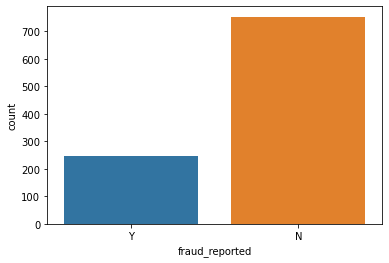

In [36]:
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'])
plt.show()

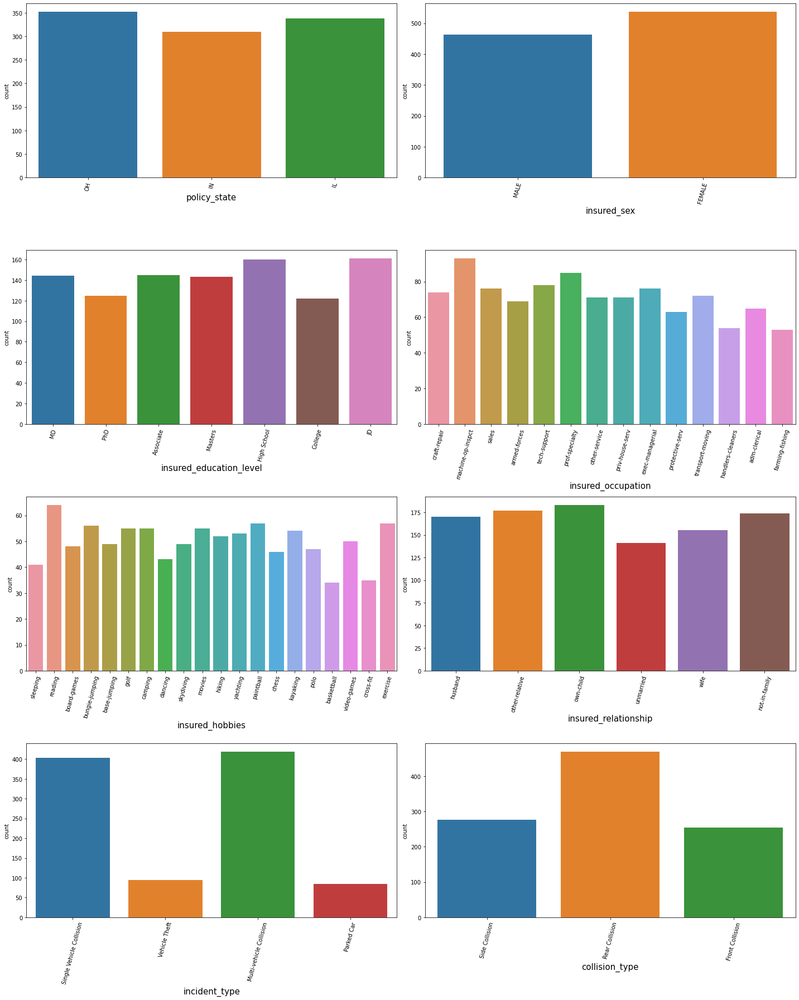

In [37]:
plt.figure(figsize=(20,25))
plotnumber=1
for col in categorical_col:
    if plotnumber<=8:
        ax = plt.subplot(4,2,plotnumber)
        sns.countplot(df[col])
        plt.xticks(rotation=75)
        plt.xlabel(col,fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

**Key Insights:**
- policy states are almost equally distributed
- under insured_sex, females are higher in number
- education level of the insured is almost equally distributed
- machine op inspector and professors are the highest in terms of occupation of insured
- in terms of type of incident, single vehicle collision and multi vehicle collisions are almost equal in number, followed by vehicle theft and damage to a parked car
- in case of collision, rear collision is the highest, followed by side and front collisions

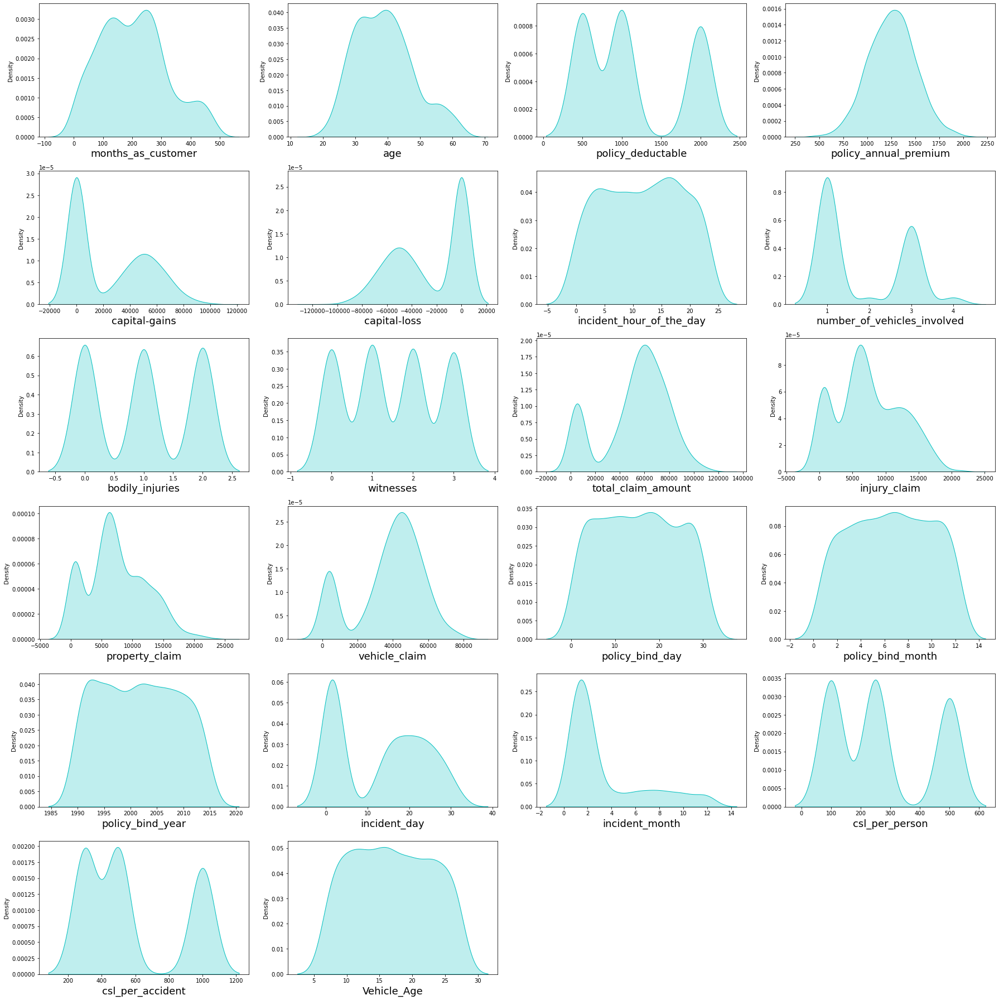

In [38]:
plt.figure(figsize=(25,25))
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color="c",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

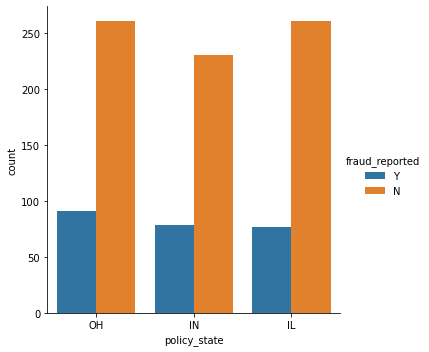

In [39]:
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported')
plt.show()

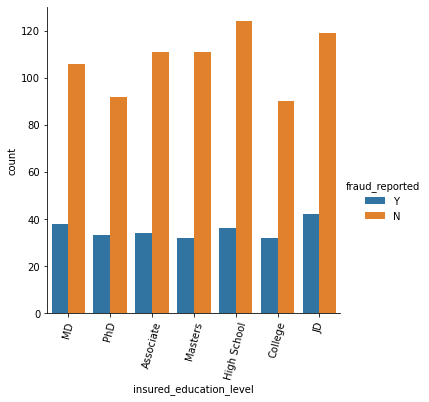

In [41]:
sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=75)
plt.show()

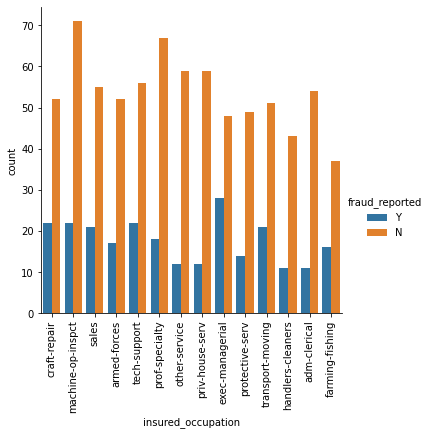

In [42]:
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

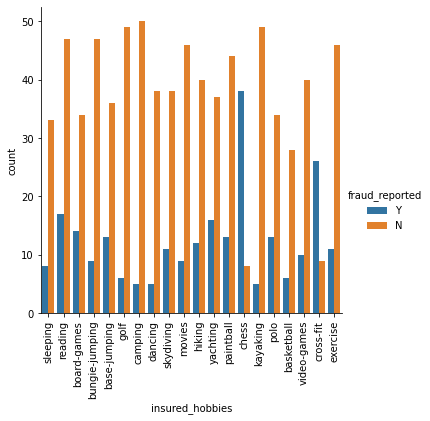

In [43]:
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

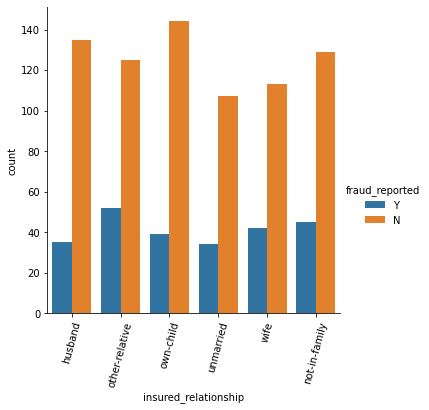

In [44]:
sns.factorplot('insured_relationship',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=75)
plt.show()

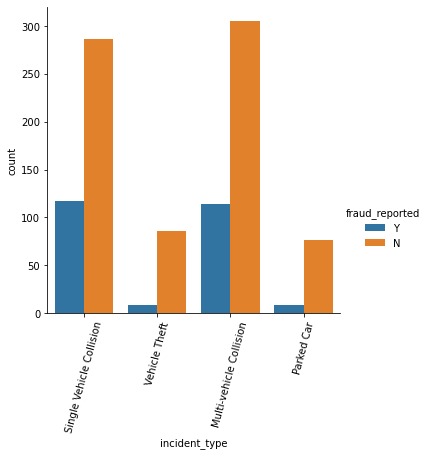

In [45]:
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=75)
plt.show()

`Fraud is very high in case of vehicle collisions - single-vehicle as well as multi-vehicle`

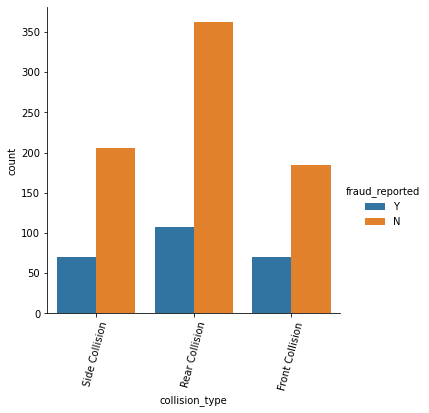

In [46]:
sns.factorplot('collision_type',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=75)
plt.show()

`Fraud reported is highest in case of rear collisions, followed by side and front collisions`

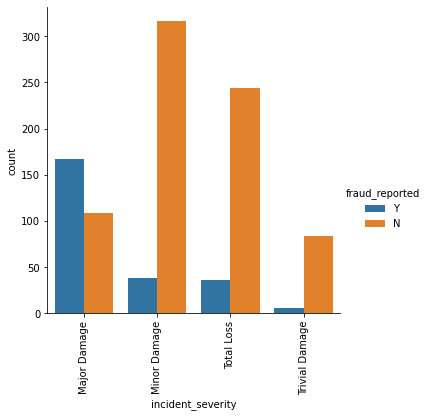

In [47]:
sns.factorplot('incident_severity',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

`Frauds are very high in cases of major damage, possibly towards the hope of claiming insurance. This is to the point that most major damage incidents are fraud cases`

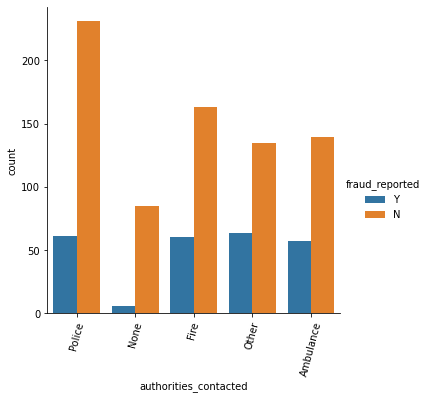

In [49]:
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=75)
plt.show()

`Almost equal number of fraud cases across the spectrum of nature of authorities contacted`

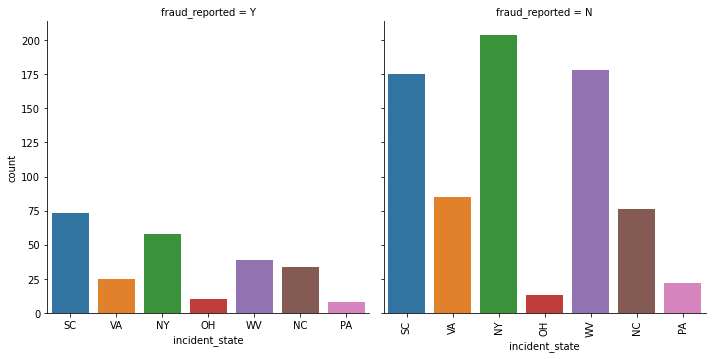

In [50]:
sns.factorplot('incident_state',kind='count',data=df,col='fraud_reported')
plt.xticks(rotation=90)
plt.show()

`highest number of frauds are in South Caroline, followed by New York, West Virginia and North Carolina`

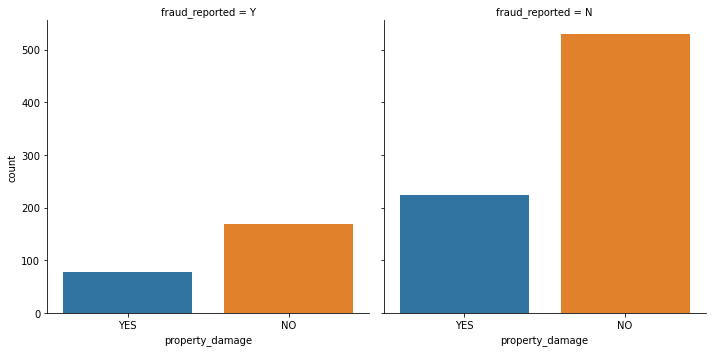

In [51]:
sns.factorplot('property_damage',kind='count',data=df,col='fraud_reported')
plt.show()

`fraud cases are very low in case of property damage, but surprisingly higher in case there is no property damage`

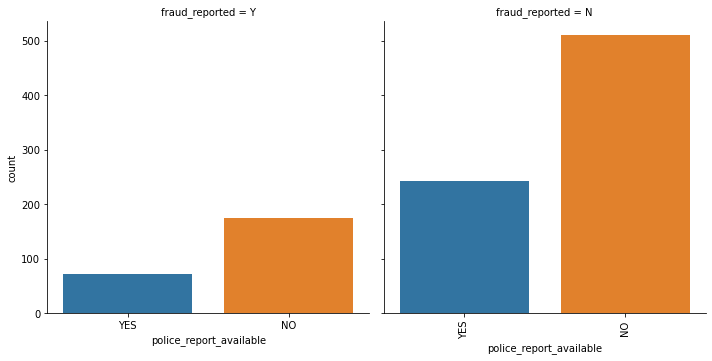

In [52]:
sns.factorplot('police_report_available',kind='count',data=df,col='fraud_reported')
plt.xticks(rotation=90)
plt.show()    

`If there is no police report, the possibility of fraud claim is very high`

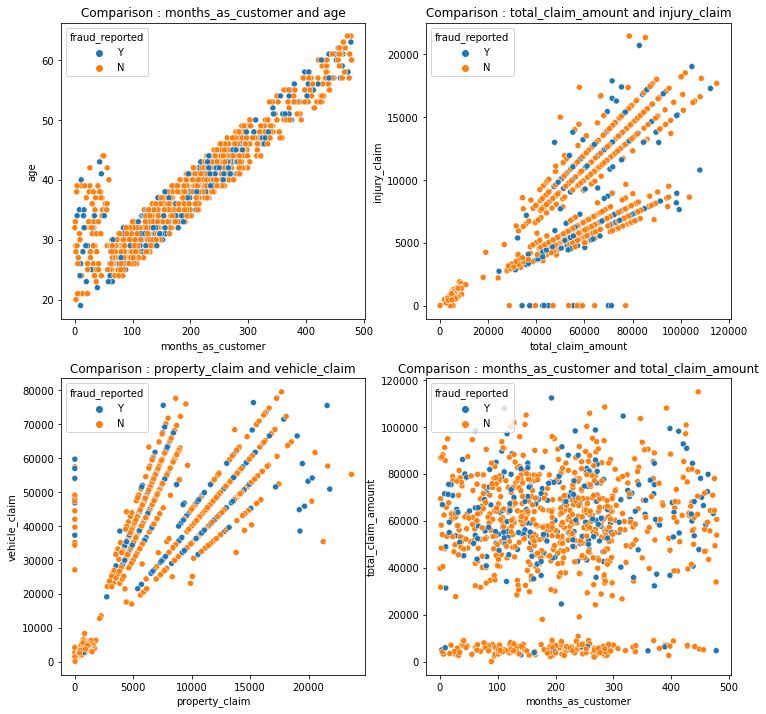

In [57]:
plt.figure(figsize=(12,12))
plt.subplot(2,2,1)
plt.title("Comparison : months_as_customer and age")
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported'])

plt.subplot(2,2,2)
plt.title("Comparison : total_claim_amount and injury_claim")
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported'])

plt.subplot(2,2,3)
plt.title("Comparison : property_claim and vehicle_claim")
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported'])

plt.subplot(2,2,4)
plt.title("Comparison : months_as_customer and total_claim_amount")
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported'])

plt.show()

**Findings:**
- positive linear relationship between months as customer and age. As length of customer relationship increases, number of fraud instances reduce
- increase in total claim amount increases with injury claim
- increase in property claim amount increases with vehicle claim
- no clear relation between months as customer and total claim amount

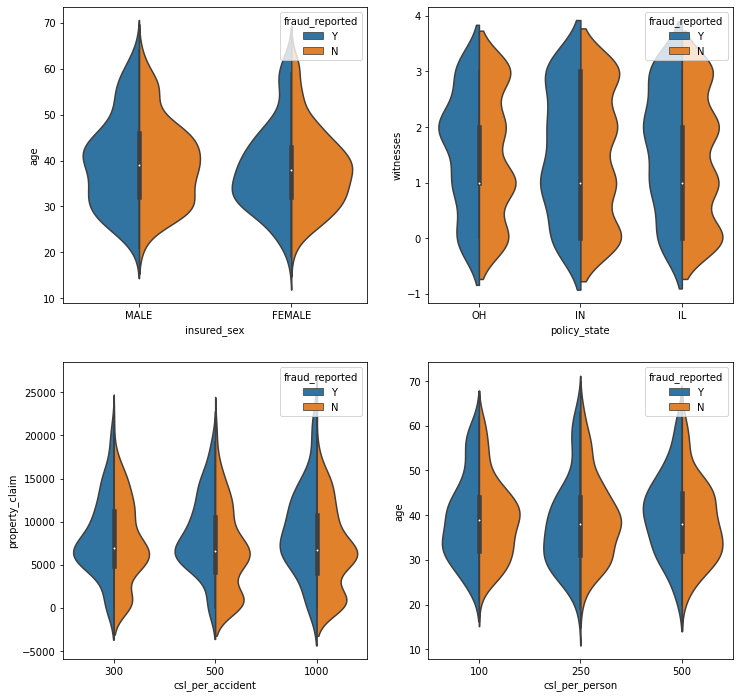

In [63]:
fig,axes=plt.subplots(2,2,figsize=(12,12))

sns.violinplot(x='insured_sex',y='age',ax=axes[0,0],data=df,hue="fraud_reported",split=True)
sns.violinplot(x='policy_state',y='witnesses',ax=axes[0,1],data=df,hue="fraud_reported",split=True)
sns.violinplot(x='csl_per_accident',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",split=True)
sns.violinplot(x='csl_per_person',y='age',ax=axes[1,1],data=df,hue="fraud_reported",split=True)

plt.show()

**Findings:**
- fraud cases are almost equal across the genders with age ranging from 27 to 43 approx.
- higher fraud in IN
- when property claim is between 5000 to 10000, more chance of fraud if combined single llimit per accident is taken
- when there is combined single limit per person, claims by people in the age range of 30 to 50 have higher fraud claims

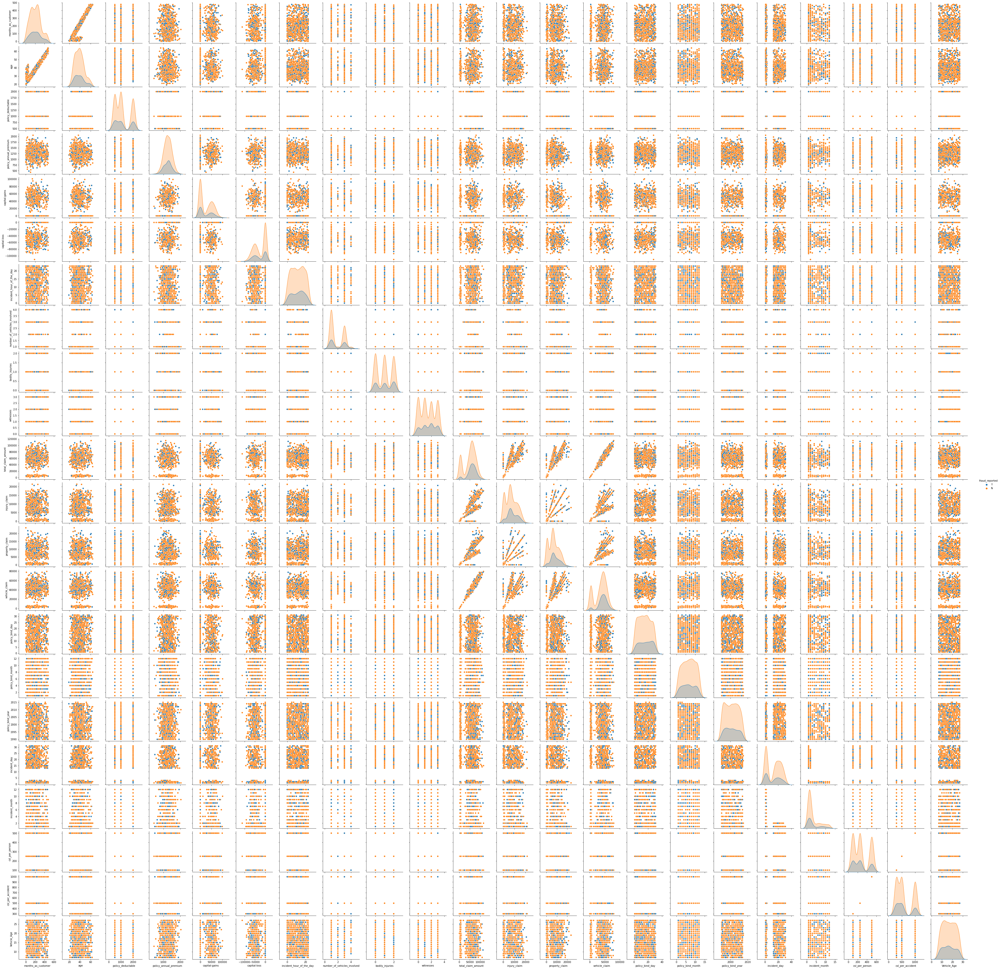

In [64]:
sns.pairplot(df,hue="fraud_reported")
plt.show()

`The pairplot gives us the relation of features with target, while also showing correlations and presence of outliers`

## Outlier Check

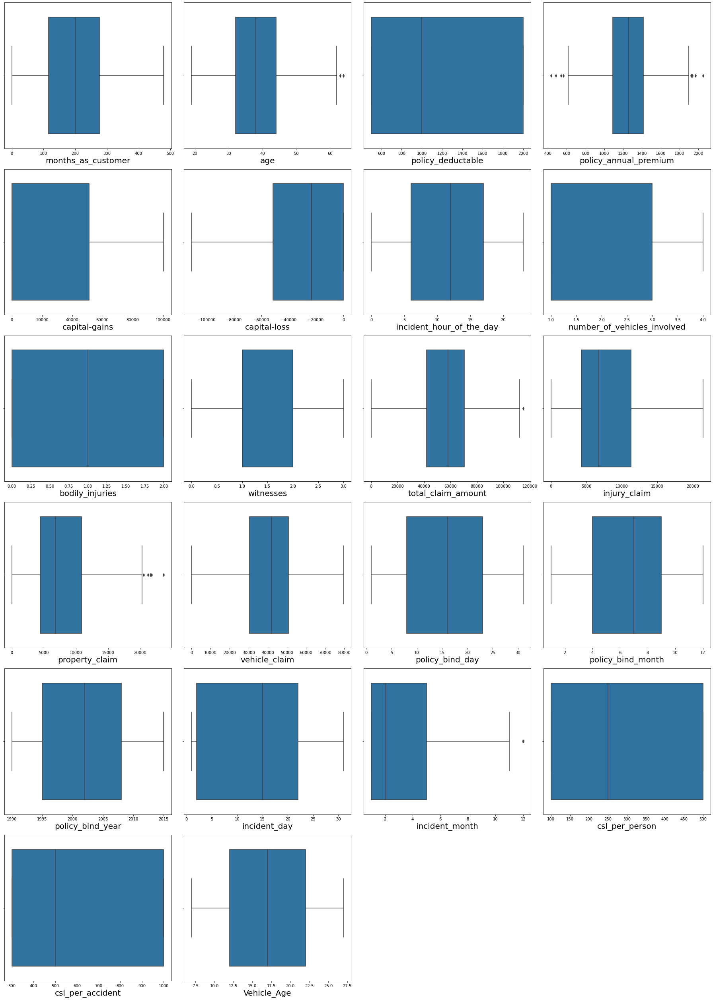

In [65]:
plt.figure(figsize=(25,35))
plotnumber=1
for col in numerical_col:
    if plotnumber<=23:
        ax = plt.subplot(6,4,plotnumber)
        sns.boxplot(df[col])
        plt.xlabel(col,fontsize=20)
    plotnumber+=1
plt.tight_layout()

`There are outliers present in incident_month, property_claim, total_claim_amount, policy_annual_premium and age`

In [68]:
features = df[["age","policy_annual_premium","total_claim_amount","property_claim","incident_month"]]
z = np.abs(zscore(features))
z

,age,policy_annual_premium,total_claim_amount,property_claim,incident_month
0,0.990836,0.616705,0.714257,1.165505,0.735040
1,0.334073,0.242521,1.807312,1.372696,0.735040
2,1.088913,0.642233,0.686362,0.736072,0.429664
3,0.224613,0.652886,0.403135,0.219722,2.013343
4,0.552994,1.341980,1.753121,1.399654,0.429664
...,...,...,...,...,...
995,0.103769,0.222884,1.305049,0.273817,0.429664
996,0.224613,0.739141,2.111466,2.214794,0.735040
997,0.541611,0.520739,0.558507,0.020826,0.735040
998,2.523284,0.411866,0.219110,0.451976,0.429664


In [69]:
new_df = df[(z<3).all(axis=1)]
new_df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,250,500,18
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,250,500,15
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,100,300,15
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,250,500,8
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,500,1000,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,N,16,7,1991,22,2,500,1000,16
996,285,41,IL,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,N,1,5,2014,24,1,100,300,7
997,130,34,OH,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,N,17,2,2003,23,1,250,500,26
998,458,62,IL,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,N,18,11,2011,26,2,500,1000,24


In [70]:
print(df.shape)
print(new_df.shape)

(1000, 39)
(996, 39)


In [71]:
loss = (1000-996)/1000*100
loss

0.4

`Since the percentage of data loss is very low, it is acceptable`

## Skewness Check

In [72]:
new_df.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
policy_bind_day                0.028923
policy_bind_month             -0.029722
policy_bind_year               0.058499
incident_day                   0.055659
incident_month                 1.377097
csl_per_person                 0.413713
csl_per_accident               0.609316
Vehicle_Age                    0.049276
dtype: float64

**Skewness Findings:**
- total_claim_amount
- vehicle_claim
- incident_month
- csl_per_accident

In [74]:
skew = ["total_claim_amount","vehicle_claim","incident_month","csl_per_accident"]
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [75]:
new_df[skew] = scaler.fit_transform(new_df[skew].values)
new_df[skew].head()

,total_claim_amount,vehicle_claim,incident_month,csl_per_accident
0,0.717556,0.754553,-1.101370,0.052612
1,-1.777785,-1.787353,-1.101370,0.052612
2,-0.716483,-0.820820,-0.026479,-1.174021
3,0.392931,0.678427,1.553647,0.052612
4,-1.730555,-1.740710,-0.026479,1.313327


In [76]:
new_df[skew].skew()

total_claim_amount   -0.508953
vehicle_claim        -0.521354
incident_month        0.305741
csl_per_accident      0.110964
dtype: float64

`Skewness has been removed`

## Encoding categorical data

In [79]:
lbl=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(lbl.fit_transform)

In [80]:
new_df[categorical_col].head()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


## Establishing correlation

In [81]:
corr = new_df.corr()
corr

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,0.007601,0.020771,-0.017202,-0.072479,-0.061932,0.011406,0.006906,-0.001837,0.068962,0.013609,0.002663,-0.011126,0.063530,-0.018760,0.064662,0.066416,0.041157,0.062392,0.049222,0.002908,0.020966,0.054175,0.004955,-0.046010,-0.013502,0.019029,-0.022063,-0.022928,-0.001287
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,0.075940,-0.006333,0.008192,-0.025979,-0.075892,-0.060361,0.016000,0.007053,-0.004009,0.085509,0.021140,-0.005795,-0.017461,0.056658,-0.018493,0.070582,0.075480,0.064230,0.062165,0.032105,0.016258,0.012408,0.054465,0.015874,-0.035505,-0.008174,0.016685,-0.012844,-0.012459,-0.003268
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,0.072552,-0.032268,0.031769,0.050953,-0.026728,-0.017738,0.009195,-0.004475,0.026464,-0.043447,-0.009334,0.008992,0.024809,0.065957,-0.008788,-0.046398,0.002678,-0.000472,0.015848,-0.024513,0.028864,0.001030,0.071527,-0.005709,0.013370,0.026233,-0.005866,-0.000653,-0.002323
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,-0.021763,0.035950,-0.024018,-0.038696,-0.054153,-0.017352,-0.000210,0.007419,-0.046560,0.059733,0.051317,0.014131,-0.023384,0.069433,0.040969,0.025169,0.040337,0.069537,0.005902,-0.034266,-0.003597,0.015833,0.011204,-0.051368,-0.048465,-0.018867,-0.000169,0.006634,0.006179,-0.027497
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,-0.009757,0.029835,0.049336,0.034999,-0.015788,-0.058852,0.049047,0.047389,-0.003001,-0.044711,0.078922,0.025323,0.006365,0.029619,0.002905,-0.024031,-0.007964,0.012961,0.011595,-0.034998,-0.010174,-0.030886,-0.028452,0.001650,0.016400,-0.012386,0.028569,0.030755,0.040439
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,-0.020651,-0.024440,0.010572,-0.014399,-0.029576,0.019000,-0.021822,0.013251,0.017950,0.019275,0.025911,-0.020201,0.044173,0.009884,-0.020117,0.004603,-0.009457,-0.026816,0.026040,-0.017679,0.032173,0.045694,-0.007259,-0.031981,-0.007249,0.024223,-0.019001,-0.008959,0.028638
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,0.040283,0.039890,0.012385,-0.020687,-0.007395,-0.011831,-0.006118,-0.019160,-0.057232,-0.001308,-0.048624,-0.011455,0.017577,0.054380,0.076528,0.083672,0.058663,0.070001,0.057528,0.050878,0.011520,0.014464,-0.007489,0.017801,-0.055411,0.069312,0.011093,0.010425,-0.045094
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,-0.007553,-0.021993,0.003427,0.006634,0.002255,-0.007367,-0.021531,-0.002158,-0.021308,-0.015177,-0.018839,-0.001830,-0.011373,-0.021730,0.006458,0.022693,0.008301,0.000954,0.044321,0.020878,0.003335,-0.003030,0.024516,-0.025282,-0.022786,0.013226,0.018978,0.019575,0.004827
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,0.053503,-0.032345,0.008256,0.016756,-0.023999,-0.028153,0.085633,0.018605,0.019802,0.011927,0.036599,0.030730,-0.034308,-0.030149,-0.003759,0.028415,0.009925,-0.015968,-0.0000

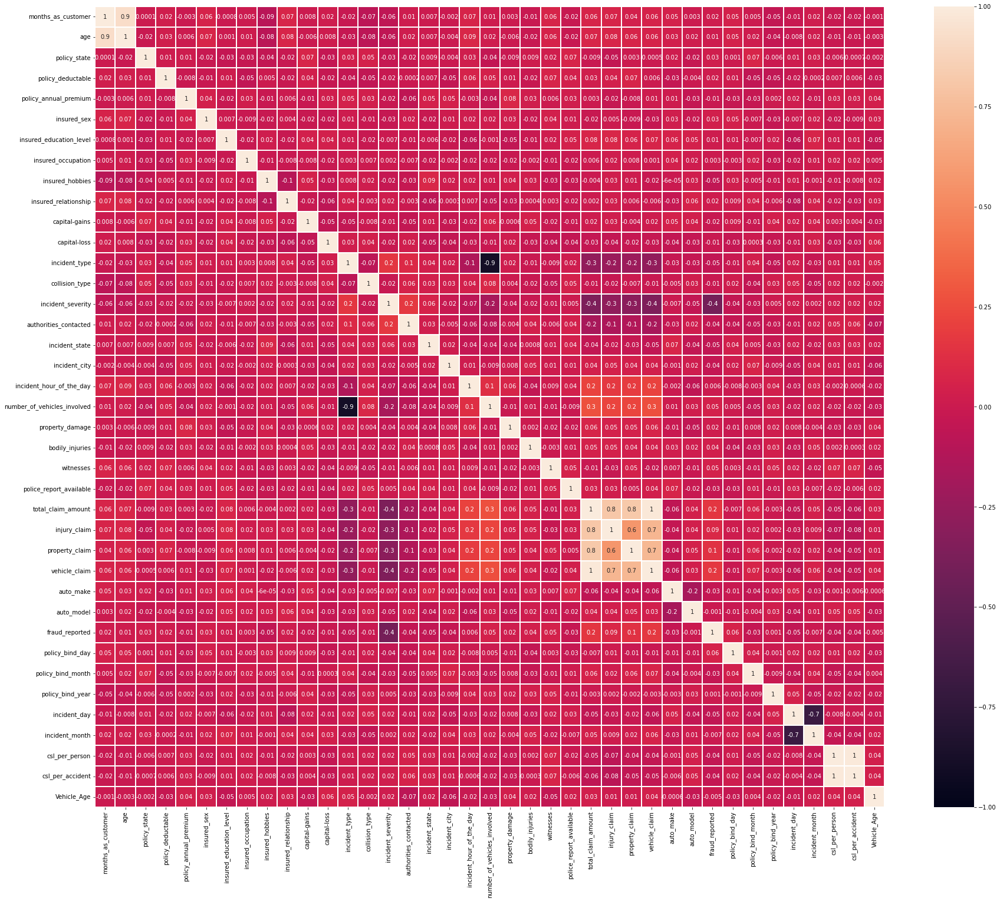

In [82]:
plt.figure(figsize=(30,25))
sns.heatmap(new_df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, annot_kws={'size':10})
plt.yticks(rotation=0)
plt.show()

- `several columns have high correlation with each other`
- `there is lot of multicollinearity, which needs to be checked and fixed through vif`

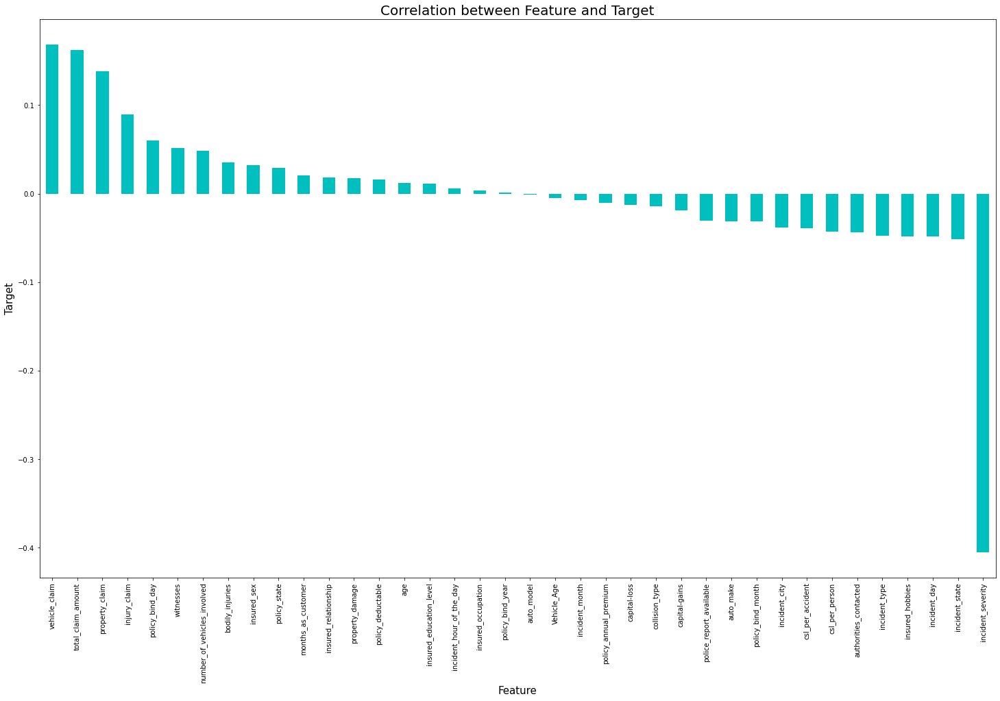

In [83]:
plt.figure(figsize=(25,15))
new_df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('Correlation between Feature and Target',fontsize=20)
plt.show()

## Standard Scaler

In [84]:
x = new_df.drop("fraud_reported", axis=1)
y = new_df["fraud_reported"]

In [85]:
print(x.shape)
print(y.shape)

(996, 38)
(996,)


In [86]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x.head(10)

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,1.074671,0.987190,1.186130,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.824928,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,-1.644810,0.177487,1.013751,1.686176,1.139807,-1.101370,-0.137684,0.052612,0.182338
1,0.204846,0.330455,-0.018137,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.824928,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,-0.657437,1.309223,-0.166145,0.599693,0.756374,-1.101370,-0.137684,0.052612,-0.316587
2,-0.612790,-1.092470,1.186130,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.138341,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,0.958263,-0.727901,-0.166145,-0.215170,0.852233,-0.026479,-1.066352,-1.174021,-0.316587
3,0.448397,0.221000,-1.222403,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.824928,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.317308,1.082875,-0.461119,-1.573274,-1.160788,1.553647,-0.137684,0.052612,-1.480744
4,0.204846,0.549367,-1.222403,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.824928,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,1.048024,-1.067422,-0.166145,1.686176,0.372942,-0.026479,1.410096,1.313327,-0.649203
5,0.448397,0.002088,1.186130,-0.224722,0.389086,-0.930144,1.557206,1.327802,-1.184493,0.942878,-0.900970,0.953763,-1.083075,-0.030351,-1.261019,-0.760546,0.352556,-1.453652,1.056052,1.138341,-0.659665,-1.213749,0.466826,-0.675382,0.420495,-0.208665,-0.203382,0.709752,0.857248,-1.465288,-0.614728,1.603698,0.599693,-1.160788,-0.026479,-0.137684,0.052612,0.348646
6,-0.586695,-0.545191,-0.018137,-0.224722,0.315209,1.075102,1.557206,0.580773,-1.360550,-1.436113,-0.900970,-1.789374,-1.083075,-1.404433,-0.197535,1.196829,-1.037202,1.482146,-1.679333,1.138341,-0.659665,-1.213749,-1.335340,-0.675382,0.998112,2.875131,-0.049131,0.640989,0.609117,0.868502,-1.067422,-0.756093,-0.215170,-0.010490,-1.101370,-0.137684,0.052612,-1.148128
7,-0.343144,-0.216824,-1.222403,-0.224722,-0.501890,1.075102,-1.521148,1.327802,-1.712663,0.942878,-0.900970,0.953763,-1.083075,-1.404433,0.865950,1.196829,0.815808,-0.964353,1.631922,1.138341,-0.659665,1.228462,0.466826,1.480644,-0.068549,0.400303,0.415704,-0.304469,-1.375932,-1.285765,-1.520116,-1.051067,-1.573274,1.331523,-0.026479,-1.066352,-1.174021,-1.647052
8,-1.543503,-0.654647,-1.222403,-1.041595,0.771539,-0.930144,1.557206,0.082753,-0.128154,0.348131,-0.900970,0.953763,0.765670,-1.404433,0.865950,1.196829,1.279061,-1.453652,1.343987,-0.824928,-0.659665,0.007356,-0.434257,1.480644,-0.976153,-0.955009,-0.962127,-0.869814,1.353510,-0.926721,-1.520116,-0.461119,-0.622601,1.619098,-1.101370,-1.066352,-1.174021,-1.148128
9,0.065674,0.330455,-1.222403,-1.041595,0.241665,1.075102,1.557206,0.331763,-1.008437,1.537626

## Multicollinearity Check

In [87]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.851319,months_as_customer
1,6.855557,age
2,1.039410,policy_state
3,1.045656,policy_deductable
4,1.037450,policy_annual_premium
5,1.037410,insured_sex
6,1.047043,insured_education_level
7,1.017493,insured_occupation
8,1.052669,insured_hobbies
9,1.052965,insured_relationship


In [88]:
# Dropping column with highest vif
x.drop(['total_claim_amount'],axis=1,inplace=True)

In [89]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.849523,months_as_customer
1,6.855452,age
2,1.039378,policy_state
3,1.044129,policy_deductable
4,1.036722,policy_annual_premium
5,1.034404,insured_sex
6,1.046991,insured_education_level
7,1.016776,insured_occupation
8,1.050855,insured_hobbies
9,1.052941,insured_relationship


In [90]:
# Dropping column with highest vif
x.drop(['csl_per_person'],axis=1,inplace=True)

In [91]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.848109,months_as_customer
1,6.853750,age
2,1.038033,policy_state
3,1.043957,policy_deductable
4,1.036476,policy_annual_premium
5,1.028901,insured_sex
6,1.046977,insured_education_level
7,1.016722,insured_occupation
8,1.049220,insured_hobbies
9,1.049218,insured_relationship


`Problem of multicollinearity has been resolved`

## Dataset Imbalance

In [92]:
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

In [93]:
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [94]:
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

`Dataset has been balanced using SMOTE`

## Model Building

In [95]:
# finding best random state
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = TTS(x,y,test_size=0.20,random_state=i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu,"at random_state",maxRS)

Best accuracy is  0.9266666666666666 at random_state 80


In [96]:
x_train,x_test,y_train,y_test = TTS(x,y,test_size=0.20,random_state=maxRS)

In [97]:
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
lr= LogisticRegression()
svc =  SVC()
knn = KNeighborsClassifier()

In [98]:
dt.fit(x_train,y_train)
rf.fit(x_train,y_train)
svc.fit(x_train,y_train)
lr.fit(x_train,y_train)
knn.fit(x_train,y_train)

KNeighborsClassifier()

### Decision Tree

In [99]:
dt_pred = dt.predict(x_test)
accu = classification_report(y_test,dt_pred)

In [100]:
cm = confusion_matrix(y_test,dt_pred)
cm

array([[125,  22],
       [ 18, 135]], dtype=int64)

In [101]:
print(accu)

              precision    recall  f1-score   support

           0       0.87      0.85      0.86       147
           1       0.86      0.88      0.87       153

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300



### Logistic Regression

In [102]:
lr_pred = lr.predict(x_test)
accu = classification_report(y_test,lr_pred)

In [103]:
cm = confusion_matrix(y_test,lr_pred)
cm

array([[116,  31],
       [ 44, 109]], dtype=int64)

In [104]:
print(accu)

              precision    recall  f1-score   support

           0       0.72      0.79      0.76       147
           1       0.78      0.71      0.74       153

    accuracy                           0.75       300
   macro avg       0.75      0.75      0.75       300
weighted avg       0.75      0.75      0.75       300



### Random Forest

In [105]:
rf_pred = rf.predict(x_test)
accu = classification_report(y_test,rf_pred)

In [106]:
cm = confusion_matrix(y_test,rf_pred)
cm

array([[140,   7],
       [ 15, 138]], dtype=int64)

In [107]:
print(accu)

              precision    recall  f1-score   support

           0       0.90      0.95      0.93       147
           1       0.95      0.90      0.93       153

    accuracy                           0.93       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.93      0.93      0.93       300



### SVC

In [108]:
svc_pred = svc.predict(x_test)
accu = classification_report(y_test,svc_pred)

In [109]:
cm = confusion_matrix(y_test,svc_pred)
cm

array([[128,  19],
       [ 12, 141]], dtype=int64)

In [110]:
print(accu)

              precision    recall  f1-score   support

           0       0.91      0.87      0.89       147
           1       0.88      0.92      0.90       153

    accuracy                           0.90       300
   macro avg       0.90      0.90      0.90       300
weighted avg       0.90      0.90      0.90       300



### KNN

In [111]:
knn_pred = knn.predict(x_test)
accu = classification_report(y_test,knn_pred)

In [112]:
cm = confusion_matrix(y_test,knn_pred)
cm

array([[ 50,  97],
       [  5, 148]], dtype=int64)

In [113]:
print(accu)

              precision    recall  f1-score   support

           0       0.91      0.34      0.50       147
           1       0.60      0.97      0.74       153

    accuracy                           0.66       300
   macro avg       0.76      0.65      0.62       300
weighted avg       0.75      0.66      0.62       300



## Model Cross Validation

In [114]:
print("Cross Validation Score for Decision Tree: ",cross_val_score(dt,x,y,cv=5).mean())
print("Cross Validation Score for Logistic Regression: ",cross_val_score(lr,x,y,cv=5).mean())
print("Cross Validation Score for Random Forest: ",cross_val_score(rf,x,y,cv=5).mean())
print("Cross Validation Score for SVC: ",cross_val_score(svc,x,y,cv=5).mean())
print("Cross Validation Score for KNN: ",cross_val_score(knn,x,y,cv=5).mean())

Cross Validation Score for Decision Tree:  0.8313333333333333
Cross Validation Score for Logistic Regression:  0.7346666666666666
Cross Validation Score for Random Forest:  0.8646666666666667
Cross Validation Score for SVC:  0.8673333333333334
Cross Validation Score for KNN:  0.67


### `Random Forest appears to be the best model`

## ROC AUC Scores

In [115]:
print("ROC AUC Score for Decision Tree: ", roc_auc_score(y_test,dt_pred),"\n")
print("ROC AUC Score for Logistic Regression: ", roc_auc_score(y_test,lr_pred),"\n")
print("ROC AUC Score for Random Forest: ", roc_auc_score(y_test,rf_pred),"\n")
print("ROC AUC Score for SVC: ", roc_auc_score(y_test,svc_pred),"\n")
print("ROC AUC Score for KNN: ", roc_auc_score(y_test,knn_pred))

ROC AUC Score for Decision Tree:  0.8663465386154462 

ROC AUC Score for Logistic Regression:  0.7507669734560491 

ROC AUC Score for Random Forest:  0.9271708683473389 

ROC AUC Score for SVC:  0.8961584633853541 

ROC AUC Score for KNN:  0.6537281579298386


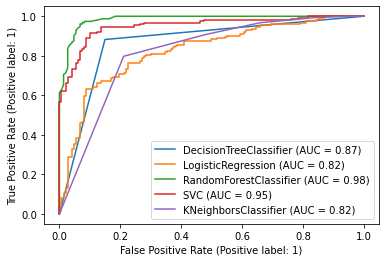

In [116]:
disp = plot_roc_curve(dt,x_test,y_test)
mod = [lr,rf,svc,knn]
for i in mod:
    plot_roc_curve(i,x_test,y_test, ax=disp.ax_)
plt.legend(prop={'size':10}, loc = 'lower right')
plt.show()

### `Random Forest appears to be the best model`

## Hyperparameter Tuning

In [117]:
parameter = {'n_estimators':[30,50],
             'max_depth': [10,20, 30],
             'min_samples_leaf':[3,5,10],
             'min_samples_split':[2,3,5],
             'criterion':['gini','entropy'],
             'max_features':["auto","sqrt"]
            }

In [118]:
GridCV = GridSearchCV(RandomForestClassifier(),parameter,cv=5,n_jobs = -1)

In [119]:
GridCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20, 30],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [3, 5, 10],
                         'min_samples_split': [2, 3, 5],
                         'n_estimators': [30, 50]})

In [120]:
GridCV.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 3,
 'min_samples_split': 3,
 'n_estimators': 50}

In [121]:
Best_mod = RandomForestClassifier(n_estimators = 50,
                                   criterion = 'entropy', 
                                   max_depth= 10, 
                                   max_features = 'sqrt', 
                                   min_samples_leaf = 3, 
                                   min_samples_split = 3)
Best_mod.fit(x_train,y_train)
rfpred = Best_mod.predict(x_test)
acc = accuracy_score(y_test,rfpred)
print(acc*100)

91.33333333333333


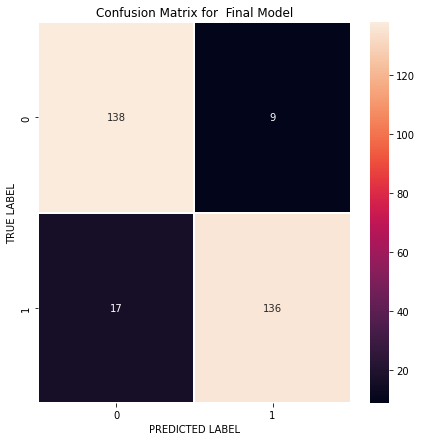

In [122]:
cm = confusion_matrix(y_test,rfpred)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, fmt = ".0f", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

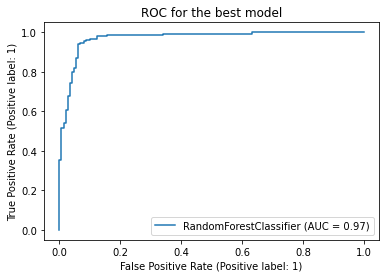

In [123]:
plot_roc_curve(Best_mod, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

## Saving the model and reloading for prediction

In [124]:
joblib.dump(Best_mod,"Insurance_Claims_Fraud_Detection.pkl")

['Insurance_Claims_Fraud_Detection.pkl']

In [125]:
model = joblib.load("Insurance_Claims_Fraud_Detection.pkl")

prediction = model.predict(x_test)
prediction

array([0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0])

In [126]:
a = np.array(y_test)
df = pd.DataFrame()
df["Predicted"] = prediction
df["Original"] = a
df

,Predicted,Original
0,0,0
1,1,1
2,1,0
3,0,0
4,0,0
...,...,...
295,0,0
296,0,0
297,1,1
298,1,1


# `END`